# Plot the distribution of the Predictions

[Plotly Jupyter Lab Support](https://plotly.com/python/getting-started/#jupyterlab-support-python-35)

In [1]:
from pathlib import Path

import torch
import plotly.graph_objects as go

CACHE_DIR = Path("../cache/")

In [2]:
train_dict, valid_dict, test_dict = torch.load(str(CACHE_DIR / "distill-dicts.jbl"))

In [3]:
TEMPERATURE = 1

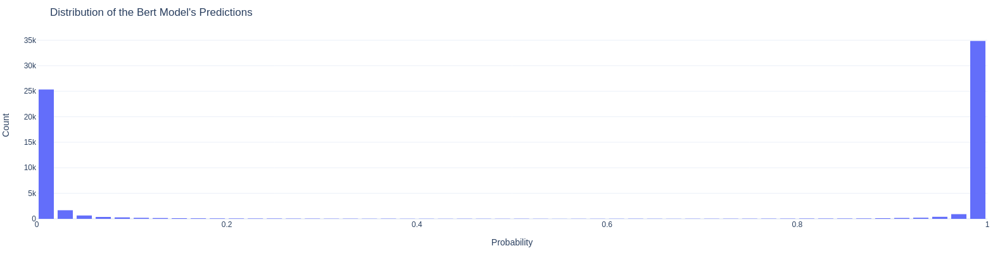

In [4]:
def plot():
    probabilities = torch.nn.functional.softmax(train_dict["logits"] / TEMPERATURE, dim=-1).numpy()[:, 1]
    fig = go.Figure(data=[go.Histogram(x=probabilities)])
    fig.update_layout(
        title_text="Distribution of the Bert Model's Predictions", 
        xaxis_title_text='Probability', # xaxis label
        yaxis_title_text='Count', # yaxis label
        bargap=0.2, # gap between bars of adjacent location coordinates
        width=800,
        height=400,
        margin=dict(l=20, r=20, t=50, b=50),
        xaxis = dict(
          range=[0,1],  # sets the range of xaxis
        ),
        template="plotly_white"
    )
    fig.show()
plot()

## Tuning the Temperatur

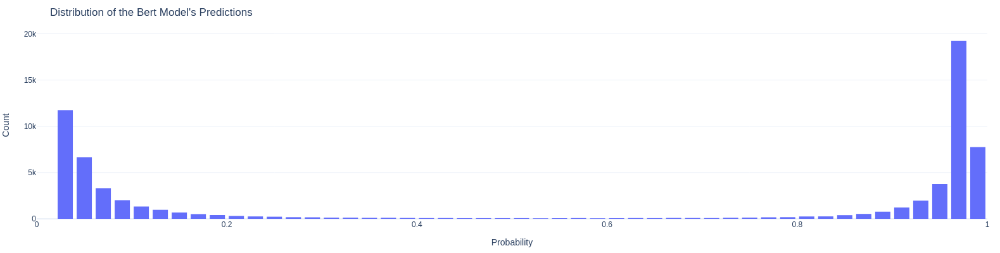

In [5]:
TEMPERATURE = 2
plot()

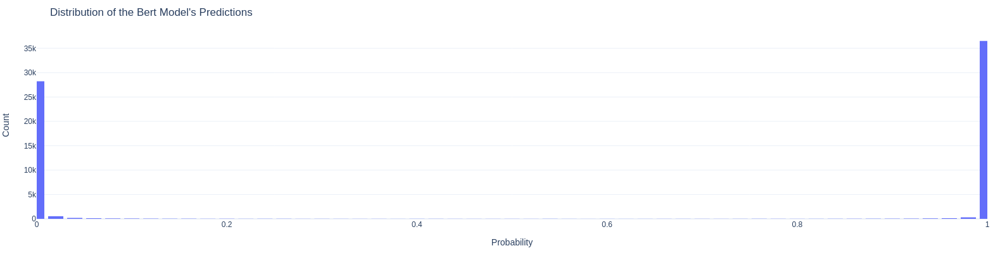

In [6]:
TEMPERATURE = 0.5
plot()